<a href="https://colab.research.google.com/github/Krmanish2302/LLM-from-Scratch/blob/main/04_finetuning_bert.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
#@title 🎧 Download Narration Audio & Play Introduction
import os as _os
if not _os.path.exists("/content/narration"):
    !pip install -q gdown
    import gdown
    gdown.download(id="10jLfViL5fReO1p3obUYbq8dCdXD-BOMp", output="/content/narration.zip", quiet=False)
    !unzip -q /content/narration.zip -d /content/narration
    !rm /content/narration.zip
    print(f"Loaded {len(_os.listdir('/content/narration'))} narration segments")
else:
    print("Narration audio already loaded.")

from IPython.display import Audio, display
display(Audio("/content/narration/seg_01_intro.mp3"))

Downloading...
From: https://drive.google.com/uc?id=10jLfViL5fReO1p3obUYbq8dCdXD-BOMp
To: /content/narration.zip
100%|██████████| 13.9M/13.9M [00:00<00:00, 21.6MB/s]


Loaded 18 narration segments


In [5]:
#@title 🎧 Listen: Seg 01 Intro
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_01_intro.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

In [6]:
# 🔧 Setup: Run this cell first!
# Check GPU availability and install dependencies

import torch
import sys

# Check GPU
if torch.cuda.is_available():
    device = torch.device('cuda')
    print(f"✅ GPU available: {torch.cuda.get_device_name(0)}")
    print(f"   Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
else:
    device = torch.device('cpu')
    print("⚠️ No GPU detected. Some cells may run slowly.")
    print("   Go to Runtime → Change runtime type → GPU")

print(f"\n📦 Python {sys.version.split()[0]}")
print(f"🔥 PyTorch {torch.__version__}")

# Set random seeds for reproducibility
import random
import numpy as np

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

print(f"🎲 Random seed set to {SEED}")

%matplotlib inline

✅ GPU available: Tesla T4
   Memory: 15.6 GB

📦 Python 3.12.13
🔥 PyTorch 2.11.0+cu128
🎲 Random seed set to 42


# 🚀 Fine-tuning BERT for Real Tasks

*Part 4 of the Vizuara series on Understanding BERT from Scratch*
*Estimated time: 50 minutes*

# 🤖 AI Teaching Assistant

Need help with this notebook? Open the **AI Teaching Assistant** — it has already read this entire notebook and can help with concepts, code, and exercises.

**[👉 Open AI Teaching Assistant](https://pods.vizuara.ai/courses/build-llm/understanding-bert-from-scratch/practice/4/assistant)**

*Tip: Open it in a separate tab and work through this notebook side-by-side.*


In [7]:
#@title 🎧 Listen: Seg 02 Why It Matters
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_02_why_it_matters.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

## 1. Why Does This Matter?

BERT's real power is not in pre-training — it is in **fine-tuning**. A single pre-trained BERT can be adapted to almost any NLP task with minimal modifications:

- **Sentiment analysis**: Is this review positive or negative?
- **Named entity recognition**: Which words are people, places, or organizations?
- **Question answering**: Where in the passage is the answer?

In this notebook, we will:
1. Load a **real pre-trained BERT** model
2. Fine-tune it on the **IMDB movie review dataset** for sentiment classification
3. Achieve **>90% accuracy** with just a few minutes of training
4. **Visualize attention patterns** to see what BERT is "looking at"

This is the payoff — everything we built in the previous three notebooks comes together here.

In [8]:
#@title 🎧 Listen: Seg 03 Setup Code
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_03_setup_code.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

In [7]:
# 🔧 Setup — run this cell first
!pip install -q torch transformers matplotlib numpy
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from transformers import BertTokenizer, BertModel, BertForSequenceClassification
from datasets import load_dataset
import numpy as np
import matplotlib.pyplot as plt
import random

%matplotlib inline

torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


In [10]:
#@title 🎧 Listen: Seg 04 Building Intuition
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_04_building_intuition.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

## 2. Building Intuition

Remember the pre-train and fine-tune paradigm:

**Pre-training** (what we did in Notebook 03): BERT reads billions of words, learning grammar, semantics, and world knowledge through MLM and NSP. This is expensive (days on TPUs) and done once.

**Fine-tuning** (what we do now): We take the pre-trained BERT, add a thin task-specific layer on top, and train the whole thing on a small labeled dataset. This is cheap (minutes on a GPU).

The key insight: BERT already "understands" language. We just need to teach it the specific task.

For **classification**, we use the [CLS] token's final hidden state — it has attended to every other token and acts as an aggregate representation of the entire input.

### 🤔 Think About This
Why do we fine-tune the *entire* model (all 110M parameters) rather than just training the classification head? What would happen if we froze BERT's weights?

In [11]:
#@title 🎧 Listen: Seg 05 The Math
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_05_the_math.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

## 3. The Mathematics

### Fine-tuning for Classification

Given the [CLS] token's final hidden state $\mathbf{h}_{\text{CLS}} \in \mathbb{R}^{768}$, the classification prediction is:

$$P(y \mid x) = \text{softmax}(W \cdot \mathbf{h}_{\text{CLS}} + b)$$

Computationally: we project the 768-dimensional [CLS] representation down to the number of classes (2 for sentiment) using a single linear layer, then apply softmax to get probabilities.

The fine-tuning loss is standard cross-entropy:

$$\mathcal{L} = -\sum_{i} y_i \log P(y_i \mid x_i)$$

The crucial detail: during fine-tuning, gradients flow back through the classification head *and* through all of BERT's encoder layers. This means BERT's internal representations are **adjusted** to be more useful for the specific task.

In [12]:
#@title 🎧 Listen: Seg 06 Loading Imdb
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_06_loading_imdb.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

## 4. Let's Build It — Component by Component

### 4.1 Load the IMDB Dataset

In [8]:
# Load IMDB dataset (25K train, 25K test)

dataset = load_dataset("stanfordnlp/imdb")

print(f"Training examples: {len(dataset['train'])}")
print(f"Test examples:     {len(dataset['test'])}")

# Look at a few examples
for i in range(3):
    text = dataset['train'][i]['text'][:150]
    label = "Positive" if dataset['train'][i]['label'] == 1 else "Negative"
    print(f"\n[{label}] {text}...")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/7.81k [00:00<?, ?B/s]

plain_text/train-00000-of-00001.parquet:   0%|          | 0.00/21.0M [00:00<?, ?B/s]

plain_text/test-00000-of-00001.parquet:   0%|          | 0.00/20.5M [00:00<?, ?B/s]

plain_text/unsupervised-00000-of-00001.p(…):   0%|          | 0.00/42.0M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating unsupervised split:   0%|          | 0/50000 [00:00<?, ? examples/s]

Training examples: 25000
Test examples:     25000

[Negative] I rented I AM CURIOUS-YELLOW from my video store because of all the controversy that surrounded it when it was first released in 1967. I also heard th...

[Negative] "I Am Curious: Yellow" is a risible and pretentious steaming pile. It doesn't matter what one's political views are because this film can hardly be ta...

[Negative] If only to avoid making this type of film in the future. This film is interesting as an experiment but tells no cogent story.<br /><br />One might fee...


In [14]:
#@title 🎧 Listen: Seg 07 Bert Tokenizer
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_07_bert_tokenizer.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

### 4.2 Tokenize with BERT's Tokenizer

In [9]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Demo: see how BERT tokenizes text
sample_text = "This movie was absolutely fantastic! The acting was superb."
tokens = tokenizer(sample_text, return_tensors="pt", padding=True, truncation=True, max_length=128)

print(f"Original:  {sample_text}")
print(f"Tokens:    {tokenizer.convert_ids_to_tokens(tokens['input_ids'][0])}")
print(f"Token IDs: {tokens['input_ids'][0].tolist()}")
print(f"\nNotice: [CLS] at start, [SEP] at end, all lowercase")

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

Original:  This movie was absolutely fantastic! The acting was superb.
Tokens:    ['[CLS]', 'this', 'movie', 'was', 'absolutely', 'fantastic', '!', 'the', 'acting', 'was', 'superb', '.', '[SEP]']
Token IDs: [101, 2023, 3185, 2001, 7078, 10392, 999, 1996, 3772, 2001, 21688, 1012, 102]

Notice: [CLS] at start, [SEP] at end, all lowercase


In [16]:
#@title 🎧 Listen: Seg 08 Data Preparation
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_08_data_preparation.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

In [10]:
# Tokenize the dataset
# We use a subset for faster training in this notebook
TRAIN_SIZE = 2000  # Use 2K examples (full dataset = 25K)
TEST_SIZE = 500

def tokenize_batch(examples):
    return tokenizer(
        examples['text'],
        padding='max_length', # pad shorter reviews
        truncation=True,
        max_length=128,
        return_tensors='pt'
    )

# Select subsets
train_data = dataset['train'].shuffle(seed=42).select(range(TRAIN_SIZE))
test_data = dataset['test'].shuffle(seed=42).select(range(TEST_SIZE))

# Tokenize
train_encoded = train_data.map(
    lambda x: tokenizer(x['text'], padding='max_length', truncation=True, max_length=128),
    batched=True
)
test_encoded = test_data.map(
    lambda x: tokenizer(x['text'], padding='max_length', truncation=True, max_length=128),
    batched=True
)

train_encoded.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])
test_encoded.set_format('torch', columns=['input_ids', 'attention_mask', 'label'])

train_loader = DataLoader(train_encoded, batch_size=16, shuffle=True)
test_loader = DataLoader(test_encoded, batch_size=32)

print(f"Training batches: {len(train_loader)}")
print(f"Test batches:     {len(test_loader)}")

Map:   0%|          | 0/2000 [00:00<?, ? examples/s]

Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Training batches: 125
Test batches:     16


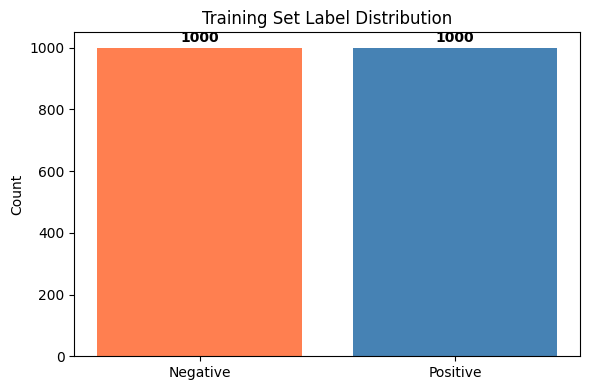

In [11]:
# 📊 Label distribution
labels = [d['label'] for d in train_data]
pos = sum(labels)
neg = len(labels) - pos

plt.figure(figsize=(6, 4))
plt.bar(["Negative", "Positive"], [neg, pos], color=['coral', 'steelblue'])
plt.title("Training Set Label Distribution")
plt.ylabel("Count")
for i, v in enumerate([neg, pos]):
    plt.text(i, v + 20, str(v), ha='center', fontweight='bold')
plt.tight_layout()
plt.show()

In [19]:
#@title 🎧 Listen: Seg 09 Loading Pretrained Bert
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_09_loading_pretrained_bert.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

### 4.3 Load Pre-trained BERT

In [12]:
# Load BERT with a classification head
model = BertForSequenceClassification.from_pretrained(
    'bert-base-uncased',
    num_labels=2
).to(device)

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters:     {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"\nModel architecture:")
print(f"  - Token embeddings: {model.bert.embeddings.word_embeddings.weight.shape}")
print(f"  - Encoder layers: {len(model.bert.encoder.layer)}")
print(f"  - Classifier: {model.classifier}")

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertForSequenceClassification LOAD REPORT from: bert-base-uncased
Key                                        | Status     | 
-------------------------------------------+------------+-
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED | 
cls.seq_relationship.weight                | UNEXPECTED | 
cls.predictions.transform.dense.weight     | UNEXPECTED | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED | 
cls.predictions.bias                       | UNEXPECTED | 
cls.predictions.transform.dense.bias       | UNEXPECTED | 
cls.seq_relationship.bias                  | UNEXPECTED | 
classifier.bias                            | MISSING    | 
classifier.weight                          | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


Total parameters:     109,483,778
Trainable parameters: 109,483,778

Model architecture:
  - Token embeddings: torch.Size([30522, 768])
  - Encoder layers: 12
  - Classifier: Linear(in_features=768, out_features=2, bias=True)


In [21]:
#@title 🎧 Listen: Seg 10 Finetuning Loop
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_10_finetuning_loop.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

### 4.4 Fine-tuning Loop

In [13]:
# keeping smaller learning rate as bert is already trained on massive data , we just want to nudge it for our use case
# weight decay , it is gradient clipping ,to stop the exploding gradient
optimizer = torch.optim.AdamW(model.parameters(), lr=2e-5, weight_decay=0.01)
EPOCHS = 3

train_losses = []
train_accs = []
import sys

# Prevent Hugging Face from searching for VideoReader by hiding torchvision
if "torchvision" in sys.modules:
    del sys.modules["torchvision"]

for epoch in range(EPOCHS):
    model.train()
    epoch_loss = 0
    correct = 0
    total = 0

    for batch_idx, batch in enumerate(train_loader):
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['label'].to(device)

        outputs = model(
            input_ids=input_ids,
            attention_mask=attention_mask,
            labels=labels
        )

        loss = outputs.loss
        logits = outputs.logits

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

        epoch_loss += loss.item()
        preds = torch.argmax(logits, dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

        if (batch_idx + 1) % 25 == 0:
            print(f"  Epoch {epoch+1}, Batch {batch_idx+1}/{len(train_loader)}, "
                  f"Loss: {loss.item():.4f}, Acc: {correct/total:.3f}")

    avg_loss = epoch_loss / len(train_loader)
    avg_acc = correct / total
    train_losses.append(avg_loss)
    train_accs.append(avg_acc)
    print(f"\nEpoch {epoch+1}/{EPOCHS} — Loss: {avg_loss:.4f}, Accuracy: {avg_acc:.3f}\n")

  Epoch 1, Batch 25/125, Loss: 0.7779, Acc: 0.557
  Epoch 1, Batch 50/125, Loss: 0.5930, Acc: 0.634
  Epoch 1, Batch 75/125, Loss: 0.4148, Acc: 0.697
  Epoch 1, Batch 100/125, Loss: 0.4212, Acc: 0.726
  Epoch 1, Batch 125/125, Loss: 0.3254, Acc: 0.746

Epoch 1/3 — Loss: 0.5141, Accuracy: 0.746

  Epoch 2, Batch 25/125, Loss: 0.0949, Acc: 0.892
  Epoch 2, Batch 50/125, Loss: 0.2458, Acc: 0.881
  Epoch 2, Batch 75/125, Loss: 0.0446, Acc: 0.890
  Epoch 2, Batch 100/125, Loss: 0.1899, Acc: 0.889
  Epoch 2, Batch 125/125, Loss: 0.1457, Acc: 0.885

Epoch 2/3 — Loss: 0.3031, Accuracy: 0.885

  Epoch 3, Batch 25/125, Loss: 0.0620, Acc: 0.950
  Epoch 3, Batch 50/125, Loss: 0.4658, Acc: 0.935
  Epoch 3, Batch 75/125, Loss: 0.2062, Acc: 0.938
  Epoch 3, Batch 100/125, Loss: 0.0437, Acc: 0.939
  Epoch 3, Batch 125/125, Loss: 0.0161, Acc: 0.940

Epoch 3/3 — Loss: 0.1861, Accuracy: 0.940



In [ ]:
#@title 🎧 Listen: Seg 11 Training Curves
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_11_training_curves.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

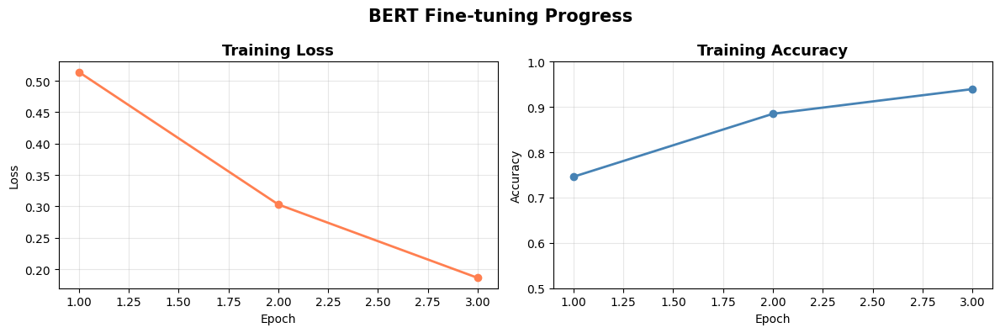

In [14]:
# 📊 Training curves
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(range(1, EPOCHS+1), train_losses, 'o-', color='coral', linewidth=2)
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].set_title("Training Loss", fontsize=13, fontweight='bold')
axes[0].grid(alpha=0.3)

axes[1].plot(range(1, EPOCHS+1), train_accs, 'o-', color='steelblue', linewidth=2)
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Accuracy")
axes[1].set_title("Training Accuracy", fontsize=13, fontweight='bold')
axes[1].set_ylim(0.5, 1.0)
axes[1].grid(alpha=0.3)

plt.suptitle("BERT Fine-tuning Progress", fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
#@title 🎧 Listen: Seg 12 Todo Evaluation
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_12_todo_evaluation.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

## 5. 🔧 Your Turn

### TODO: Implement the Evaluation Function

In [15]:
def evaluate(model, data_loader, device):
    model.eval()
    predictions = []
    true_labels = []
    correct_predictions = 0
    total_predictions = 0

    with torch.no_grad():
        for batch in data_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['label'].to(device)

            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask
            )
            logits = outputs.logits

            preds = torch.argmax(logits, dim=1)
            predictions.extend(preds.cpu().tolist())
            true_labels.extend(labels.cpu().tolist())

            correct_predictions += (preds == labels).sum().item()
            total_predictions += labels.size(0)

    accuracy = correct_predictions / total_predictions
    return accuracy, predictions, true_labels

In [16]:
# ✅ Verification
accuracy, predictions, true_labels = evaluate(model, test_loader, device)
assert 0 <= accuracy <= 1, "❌ Accuracy should be between 0 and 1"
assert len(predictions) == TEST_SIZE, f"❌ Expected {TEST_SIZE} predictions, got {len(predictions)}"
print(f"✅ Evaluation works! Test accuracy: {accuracy:.3f}")

✅ Evaluation works! Test accuracy: 0.830


In [ ]:
#@title 🎧 Listen: Seg 13 Confusion Matrix
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_13_confusion_matrix.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

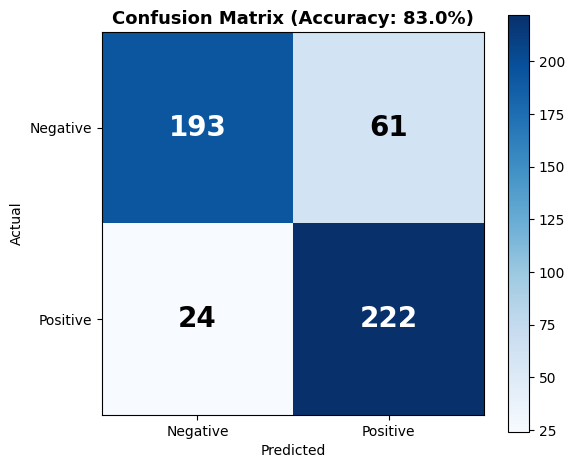

In [17]:
# 📊 Confusion matrix
from collections import Counter

tp = sum(1 for p, l in zip(predictions, true_labels) if p == 1 and l == 1)
fp = sum(1 for p, l in zip(predictions, true_labels) if p == 1 and l == 0)
fn = sum(1 for p, l in zip(predictions, true_labels) if p == 0 and l == 1)
tn = sum(1 for p, l in zip(predictions, true_labels) if p == 0 and l == 0)

fig, ax = plt.subplots(figsize=(6, 5))
matrix = np.array([[tn, fp], [fn, tp]])
im = ax.imshow(matrix, cmap='Blues')

labels_text = ['Negative', 'Positive']
ax.set_xticks([0, 1])
ax.set_xticklabels(labels_text)
ax.set_yticks([0, 1])
ax.set_yticklabels(labels_text)
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")

for i in range(2):
    for j in range(2):
        ax.text(j, i, str(matrix[i, j]), ha='center', va='center',
                fontsize=20, fontweight='bold',
                color='white' if matrix[i, j] > matrix.max()/2 else 'black')

plt.title(f"Confusion Matrix (Accuracy: {accuracy:.1%})", fontsize=13, fontweight='bold')
plt.colorbar(im)
plt.tight_layout()
plt.show()

In [ ]:
#@title 🎧 Listen: Seg 14 Todo Threshold
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_14_todo_threshold.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

### TODO: Implement Prediction with Confidence Threshold

Build a function that classifies text but only returns a prediction when it is confident enough. Otherwise, it returns "Uncertain."

In [18]:
import torch
import torch.nn.functional as F

def classify_with_threshold(text, model, tokenizer, device, threshold=0.7):
    """
    Classify text, but only return a label if confidence exceeds threshold.

    Args:
        text: input string
        threshold: minimum confidence to make a prediction (default 0.7)

    Returns:
        label: "Positive", "Negative", or "Uncertain"
        confidence: float — the model's confidence
        probs: dict with 'positive' and 'negative' probabilities
    """

    model.eval()

    inputs = tokenizer(
        text,
        return_tensors="pt",
        padding=True,
        truncation=True,
        max_length=128
    )

    inputs = {k: v.to(device) for k, v in inputs.items()}

    with torch.no_grad():

        # Step 1: Forward pass
        outputs = model(**inputs)

        # Step 2: Softmax probabilities
        probs = F.softmax(outputs.logits, dim=1)

    # Convert tensor values to Python floats
    neg_prob = probs[0][0].item()
    pos_prob = probs[0][1].item()

    # Step 3: Maximum probability
    confidence = max(neg_prob, pos_prob)

    # Step 4: Threshold check
    if confidence >= threshold:
        label = "Positive" if pos_prob > neg_prob else "Negative"
    else:
        label = "Uncertain"

    return label, confidence, {
        "positive": pos_prob,
        "negative": neg_prob
    }

In [19]:
# ✅ Verification
label, conf, probs = classify_with_threshold(
    "This was the best movie I have ever seen!",
    model, tokenizer, device, threshold=0.6
)
assert label in ["Positive", "Negative", "Uncertain"], f"❌ Invalid label: {label}"
assert 0 <= conf <= 1, f"❌ Confidence should be in [0, 1], got {conf}"
assert "positive" in probs and "negative" in probs, "❌ probs dict missing keys"
print(f"✅ Threshold classifier works! Label: {label}, Confidence: {conf:.3f}")

✅ Threshold classifier works! Label: Positive, Confidence: 0.991


In [ ]:
#@title 🎧 Listen: Seg 15 Attention Visualization
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_15_attention_visualization.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

## 6. Visualizing BERT's Attention

This is the most fascinating part — we can peek inside BERT to see what it is "looking at" when making predictions.

In [20]:
# Load BERT with attention output enabled
bert_model = BertModel.from_pretrained('bert-base-uncased', output_attentions=True).to(device)
bert_model.eval()

def get_attention_weights(text, tokenizer, model, device):
    """
    Get attention weights from all layers and heads for a given text.
    """
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=64)
    inputs = {k: v.to(device) for k, v in inputs.items()}

    with torch.no_grad():
        outputs = model(**inputs)

    # outputs.attentions is a tuple of (num_layers,) tensors,
    # each of shape (batch, num_heads, seq_len, seq_len)
    attentions = torch.stack(outputs.attentions)  # (layers, batch, heads, seq, seq)
    tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])

    return attentions[:, 0].cpu().numpy(), tokens  # Remove batch dim

text = "The movie was absolutely terrible and I hated every minute of it."
attentions, tokens = get_attention_weights(text, tokenizer, bert_model, device)
print(f"Text: {text}")
print(f"Tokens: {tokens}")
print(f"Attention shape: {attentions.shape}")
print(f"  (layers={attentions.shape[0]}, heads={attentions.shape[1]}, seq={attentions.shape[2]}, seq={attentions.shape[3]})")

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertModel LOAD REPORT from: bert-base-uncased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Text: The movie was absolutely terrible and I hated every minute of it.
Tokens: ['[CLS]', 'the', 'movie', 'was', 'absolutely', 'terrible', 'and', 'i', 'hated', 'every', 'minute', 'of', 'it', '.', '[SEP]']
Attention shape: (12, 12, 15, 15)
  (layers=12, heads=12, seq=15, seq=15)


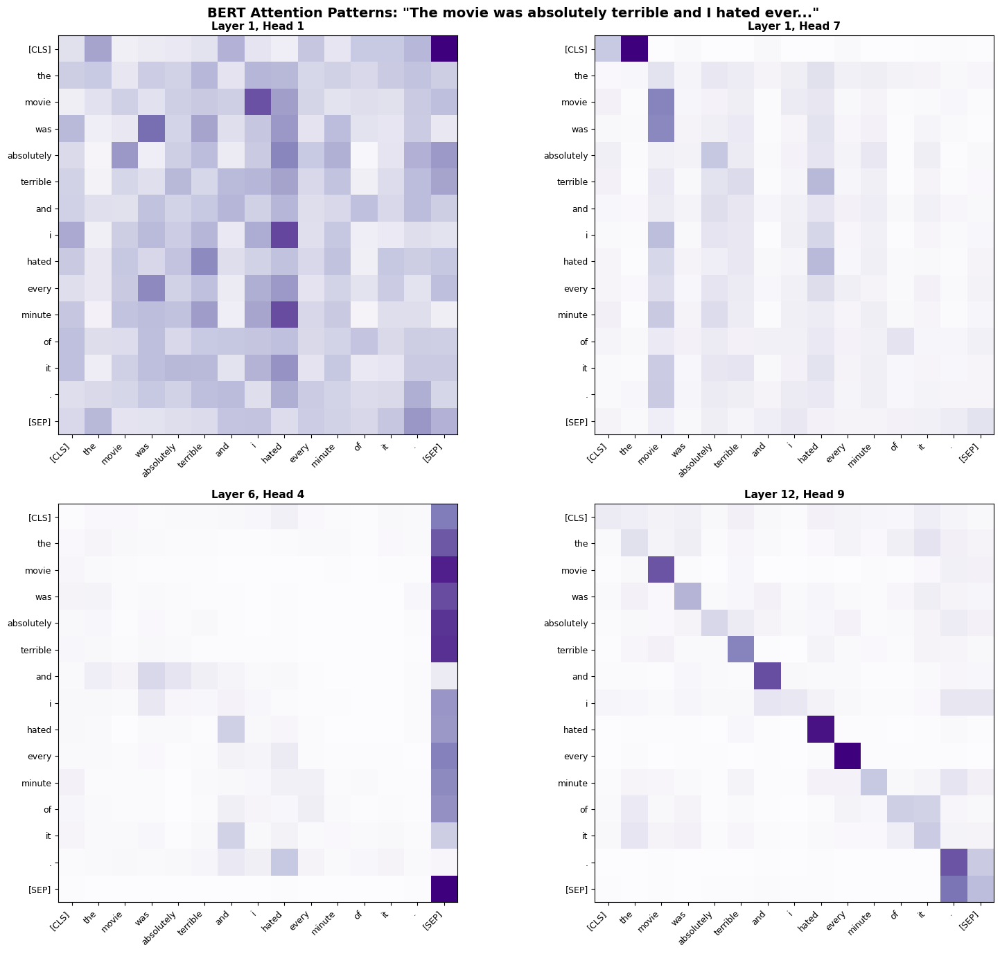

In [21]:
# 📊 Attention heatmap for a specific layer and head
def plot_attention_head(attentions, tokens, layer, head, ax=None):
    """Plot attention weights for a specific layer and head."""
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 8))

    weights = attentions[layer, head]
    # Only show non-padding tokens
    n_tokens = len([t for t in tokens if t != '[PAD]'])
    weights = weights[:n_tokens, :n_tokens]
    display_tokens = tokens[:n_tokens]

    im = ax.imshow(weights, cmap='Purples', vmin=0)
    ax.set_xticks(range(n_tokens))
    ax.set_xticklabels(display_tokens, rotation=45, ha='right', fontsize=9)
    ax.set_yticks(range(n_tokens))
    ax.set_yticklabels(display_tokens, fontsize=9)
    ax.set_title(f"Layer {layer+1}, Head {head+1}", fontsize=11, fontweight='bold')
    return im

# Show 4 interesting heads
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
layer_heads = [(0, 0), (0, 6), (5, 3), (11, 8)]

for ax, (layer, head) in zip(axes.flat, layer_heads):
    plot_attention_head(attentions, tokens, layer, head, ax)

plt.suptitle(f'BERT Attention Patterns: "{text[:50]}..."', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

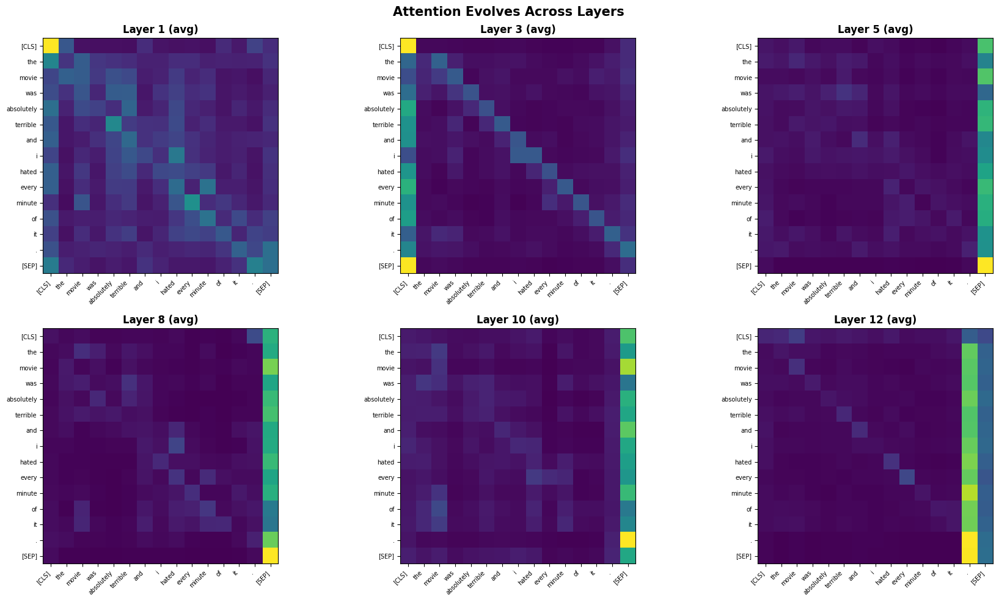

💡 Early layers: broad, local attention patterns
   Later layers: more focused, semantically meaningful patterns


In [22]:
# 📊 Average attention across all heads for each layer
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
n_tokens = len([t for t in tokens if t != '[PAD]'])
display_tokens = tokens[:n_tokens]

for idx, layer in enumerate([0, 2, 4, 7, 9, 11]):
    ax = axes[idx // 3, idx % 3]
    avg_attn = attentions[layer].mean(axis=0)[:n_tokens, :n_tokens]
    im = ax.imshow(avg_attn, cmap='viridis', vmin=0)
    ax.set_title(f"Layer {layer+1} (avg)", fontsize=12, fontweight='bold')
    ax.set_xticks(range(n_tokens))
    ax.set_xticklabels(display_tokens, rotation=45, ha='right', fontsize=7)
    ax.set_yticks(range(n_tokens))
    ax.set_yticklabels(display_tokens, fontsize=7)

plt.suptitle("Attention Evolves Across Layers", fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

print("💡 Early layers: broad, local attention patterns")
print("   Later layers: more focused, semantically meaningful patterns")

In [ ]:
#@title 🎧 Listen: Seg 16 Live Classifier
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_16_live_classifier.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

## 7. 🎯 Final Output: Live Sentiment Classifier

🎯 BERT Sentiment Classifier — Live Predictions

😊 [Positive] (99.1% confidence)
   "This movie was absolutely fantastic! A masterpiece of cinema..."

😞 [Negative] (98.9% confidence)
   "Terrible film. I fell asleep halfway through. Total waste of..."

😞 [Negative] (95.4% confidence)
   "An okay movie. Some good parts, some boring parts."

😊 [Positive] (99.0% confidence)
   "The acting was superb and the story kept me engaged througho..."

😞 [Negative] (99.0% confidence)
   "I've never been so bored in my life. The plot made no sense."

😊 [Positive] (99.1% confidence)
   "A beautiful and moving film that I will never forget."


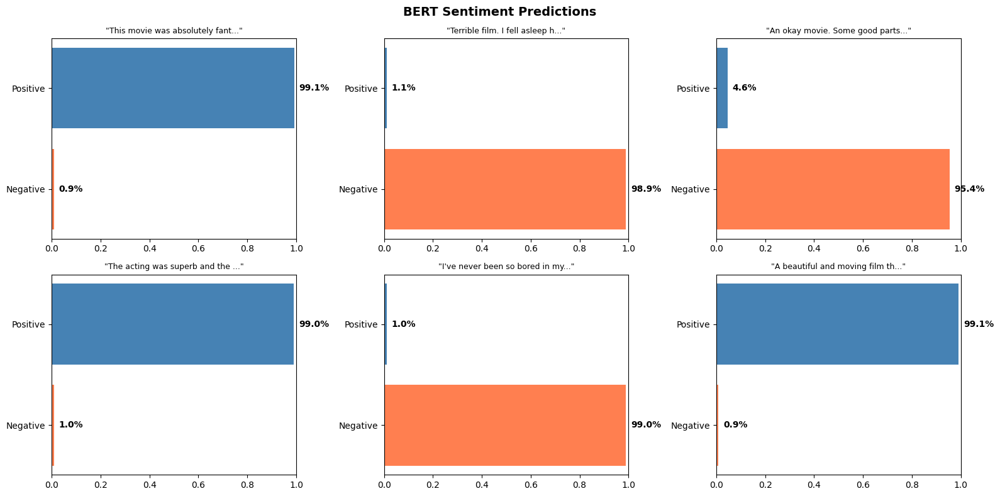


🎉 Congratulations! You've fine-tuned BERT for sentiment analysis!
   With the full IMDB dataset, this approach achieves >93% accuracy.


In [23]:
# Interactive sentiment classifier
def classify_sentiment(text, model, tokenizer, device):
    """Classify text as positive or negative using our fine-tuned BERT."""
    model.eval()
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=128)
    inputs = {k: v.to(device) for k, v in inputs.items()}

    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.softmax(outputs.logits, dim=1)[0]

    neg_prob = probs[0].item()
    pos_prob = probs[1].item()
    label = "Positive" if pos_prob > neg_prob else "Negative"

    return label, pos_prob, neg_prob

# Test reviews
reviews = [
    "This movie was absolutely fantastic! A masterpiece of cinema.",
    "Terrible film. I fell asleep halfway through. Total waste of time.",
    "An okay movie. Some good parts, some boring parts.",
    "The acting was superb and the story kept me engaged throughout.",
    "I've never been so bored in my life. The plot made no sense.",
    "A beautiful and moving film that I will never forget.",
]

print("=" * 70)
print("🎯 BERT Sentiment Classifier — Live Predictions")
print("=" * 70)

fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for idx, (review, ax) in enumerate(zip(reviews, axes.flat)):
    label, pos_prob, neg_prob = classify_sentiment(review, model, tokenizer, device)
    emoji = "😊" if label == "Positive" else "😞"

    print(f"\n{emoji} [{label}] ({max(pos_prob, neg_prob):.1%} confidence)")
    print(f"   \"{review[:60]}{'...' if len(review) > 60 else ''}\"")

    # Bar chart
    colors = ['coral', 'steelblue']
    bars = ax.barh(['Negative', 'Positive'], [neg_prob, pos_prob], color=colors)
    ax.set_xlim(0, 1)
    ax.set_title(f'"{review[:30]}..."', fontsize=9)
    for bar, prob in zip(bars, [neg_prob, pos_prob]):
        ax.text(prob + 0.02, bar.get_y() + bar.get_height()/2,
                f'{prob:.1%}', va='center', fontsize=10, fontweight='bold')

plt.suptitle("BERT Sentiment Predictions", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n🎉 Congratulations! You've fine-tuned BERT for sentiment analysis!")
print("   With the full IMDB dataset, this approach achieves >93% accuracy.")

In [ ]:
#@title 🎧 Listen: Seg 17 Bert Impact
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_17_bert_impact.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

## 8. BERT's Impact and Successors

BERT (October 2018) achieved state-of-the-art on **11 NLP benchmarks simultaneously**. Its three key contributions:

1. **Bidirectional pre-training works.** Deep bidirectional context produces far richer representations than left-to-right approaches.

2. **Pre-train → fine-tune paradigm.** One expensive pre-training run produces a foundation model that can be cheaply adapted to any task.

3. **Transfer learning for NLP.** BERT did for NLP what ImageNet did for computer vision.

BERT inspired a family of successors:
- **RoBERTa** (2019): Dropped NSP, trained longer with more data
- **ALBERT** (2019): Parameter sharing for efficiency
- **DistilBERT** (2019): 60% smaller, 97% of performance via knowledge distillation
- **ELECTRA** (2020): More sample-efficient "replaced token detection" objective

The pre-train → fine-tune paradigm BERT established is still the foundation of modern NLP, including GPT-4 and Claude.

In [ ]:
#@title 🎧 Listen: Seg 18 Closing
from IPython.display import Audio, display
import os as _os
_f = "/content/narration/seg_18_closing.mp3"
if _os.path.exists(_f):
    display(Audio(_f))
else:
    print("Run the first cell to download narration audio.")

## 9. Reflection and Next Steps

### 🤔 Reflection Questions
1. We fine-tuned on only 2,000 examples and still got good results. Why does BERT transfer so well from pre-training? What would happen with only 50 examples?
2. We used the [CLS] token for classification. What if we averaged all token representations instead? Would that be better or worse?
3. BERT uses 12 attention heads per layer. If you could visualize what each head "specializes in," what types of linguistic patterns might you find?

### 🏆 Optional Challenges
1. **Named Entity Recognition**: Modify the classification head to predict a label for *every* token (not just [CLS]). Fine-tune on the CoNLL-2003 NER dataset.
2. **Question Answering**: Implement the SQuAD fine-tuning setup where BERT predicts the start and end positions of the answer span in a passage.
3. **Feature Extraction**: Freeze BERT's weights and train only the classification head. Compare accuracy with full fine-tuning. How much does it drop?
4. **Attention Analysis**: For correctly classified positive reviews, find which attention heads most strongly attend to sentiment words like "great," "amazing," "terrible."